In [1]:
import cv2
from pathlib import Path
from imcui.ui.utils import DEVICE
from imcui.api import ImageMatchingAPI
from imcui.ui.viz import display_matches

## Loading images

In [2]:
img_path1 = "data/02928139_3448003521.jpg"
img_path2 = "data/17295357_9106075285.jpg"
image0 = cv2.imread(str(img_path1))[:, :, ::-1]  # RGB
image1 = cv2.imread(str(img_path2))[:, :, ::-1]  # RGB

## Dense matching

[2025/02/07 23:53:53 hloc INFO] Loaded LoFTR with weights outdoor
[2025/02/07 23:53:53 hloc INFO] ransac_method: CV2_USAC_MAGSAC, geometry_type: Fundamental
[2025/02/07 23:53:53 hloc INFO] ransac_method: CV2_USAC_MAGSAC, geometry_type: Homography


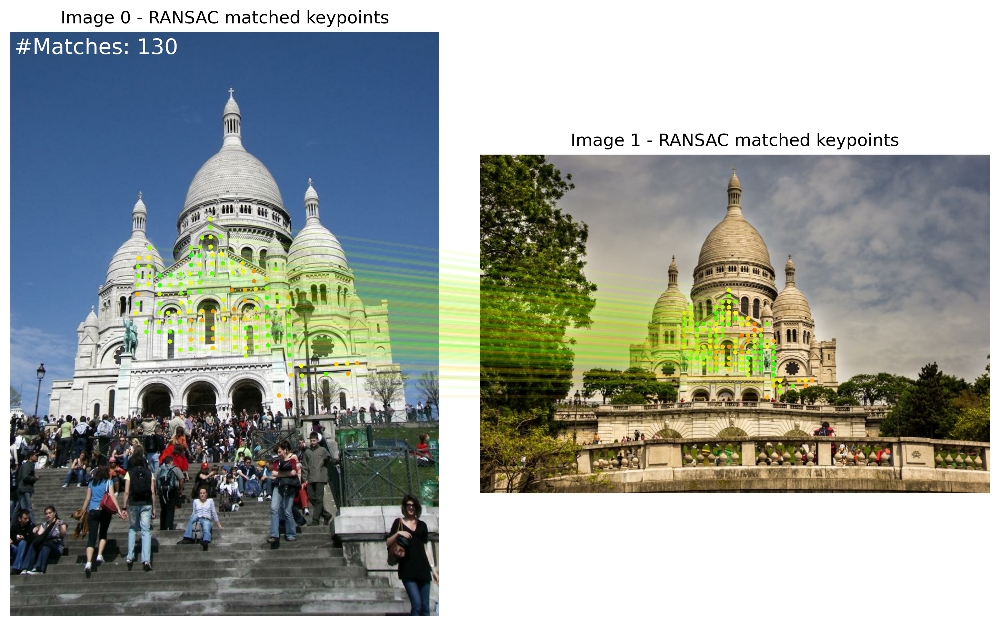

In [3]:
conf = {
    "matcher": {
        "output": "matches-loftr",
        "model": {
            "name": "loftr",
            "weights": "outdoor",
            "max_keypoints": 2000,
            "match_threshold": 0.2,
        },
        "preprocessing": {
            "grayscale": True,
            "resize_max": 1024,
            "dfactor": 8,
            "width": 640,
            "height": 480,
            "force_resize": True,
        },
        "max_error": 1,
        "cell_size": 1,
    },
    "dense": True,
}

api = ImageMatchingAPI(conf=conf, device=DEVICE)
pred = api(image0, image1)
assert pred is not None
titles = ["Image 0 - RANSAC matched keypoints", "Image 1 - RANSAC matched keypoints"]
output_matches_ransac, _ = display_matches(pred, titles=titles, tag="KPTS_RANSAC")

## Sparse matching

[2025/02/07 23:53:56 hloc INFO] Load SuperPoint model done.


Loaded SuperPoint model


[2025/02/07 23:53:56 hloc INFO] ransac_method: CV2_USAC_MAGSAC, geometry_type: Fundamental
[2025/02/07 23:53:56 hloc INFO] ransac_method: CV2_USAC_MAGSAC, geometry_type: Homography


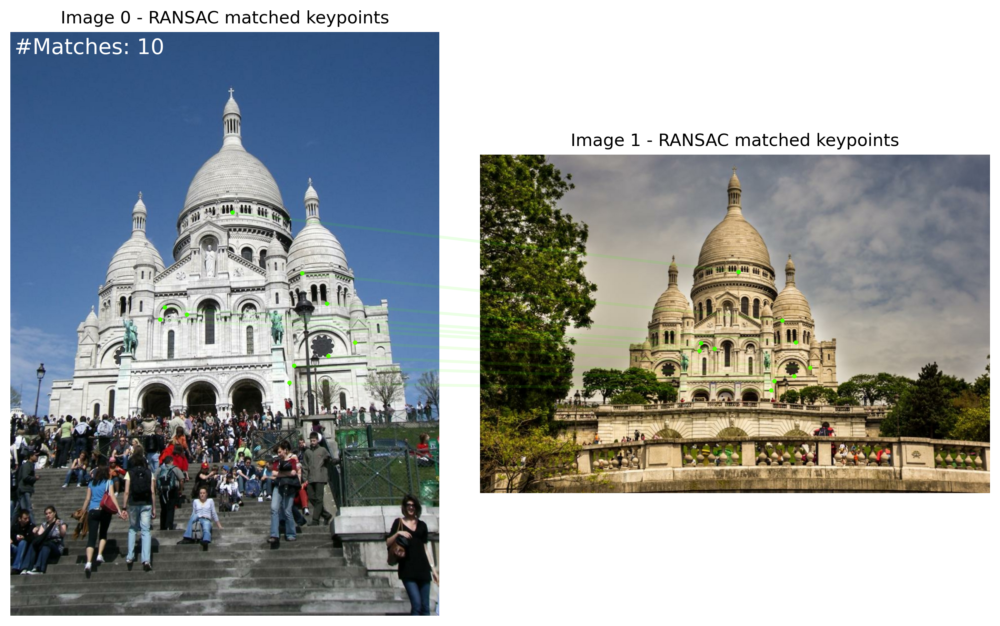

In [4]:
conf = {
    "feature": {
        "output": "feats-superpoint-n4096-rmax1600",
        "model": {
            "name": "superpoint",
            "nms_radius": 3,
            "max_keypoints": 4096,
            "keypoint_threshold": 0.000,
        },
        "preprocessing": {
            "grayscale": True,
            "force_resize": True,
            "resize_max": 1600,
            "width": 640,
            "height": 480,
            "dfactor": 8,
        },
    },
    "matcher": {
        "output": "matches-NN-mutual",
        "model": {
            "name": "nearest_neighbor",
            "do_mutual_check": True,
            "match_threshold": 0.2,
        },
    },
    "dense": False,
}

api = ImageMatchingAPI(conf=conf, device=DEVICE)
pred = api(image0, image1)
assert pred is not None
titles = ["Image 0 - RANSAC matched keypoints", "Image 1 - RANSAC matched keypoints"]
output_matches_ransac, _ = display_matches(pred, titles=titles, tag="KPTS_RANSAC")